In [13]:
import os
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader
from torchvision import datasets, transforms
import timm

dataset_dir = os.path.expanduser("~/Desktop/Raabin-WBC-Project/Raabin-WBC")
output_dir = "saved_models"
os.makedirs(output_dir, exist_ok=True)

device = torch.device("mps" if torch.backends.mps.is_available() else "cpu")


Hyperparameters & Transforms


In [22]:
batch_size = 4
lr = 3e-4
epochs = 50
patience = 7

train_transform = transforms.Compose([
    transforms.Resize((224,224)),
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(15),
    transforms.ColorJitter(0.2,0.2,0.2,0.1),
    transforms.ToTensor(),
    transforms.Normalize([0.5]*3,[0.5]*3)
])

transform = transforms.Compose([
    transforms.Resize((128, 128)),  # smaller size speeds up training
    transforms.ToTensor(),
])


Dataset & DataLoader

In [23]:
train_dataset = datasets.ImageFolder(os.path.join(dataset_dir,"Train"), transform=train_transform)
val_dataset = datasets.ImageFolder(os.path.join(dataset_dir,"Test-A"), transform=val_transform)

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)


Model, Loss & Optimizer

In [96]:
model = timm.create_model('vit_tiny_patch16_224', pretrained=True, num_classes=5)
model.to(device)

criterion = nn.CrossEntropyLoss()
optimizer = optim.AdamW(model.parameters(), lr=lr)
scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=epochs)
scaler = torch.cuda.amp.GradScaler()

/var/folders/rv/vfwv4s4d06nb6sw_l_lgxb0c0000gn/T/ipykernel_17620/3646261499.py:7: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = torch.cuda.amp.GradScaler()


Training Loop

In [94]:
num_epochs = 50
best_val_acc = 0.0
patience = 5  
counter = 0

for epoch in range(num_epochs):
    model.train()
    running_loss = 0.0
    correct = 0
    total = 0

    for images, labels in train_loader:
        images, labels = images.to(device), labels.to(device)
        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        running_loss += loss.item() * images.size(0)
        _, predicted = outputs.max(1)
        total += labels.size(0)
        correct += predicted.eq(labels).sum().item()

    epoch_loss = running_loss / len(train_loader.dataset)
    epoch_acc = 100. * correct / total

    # Validation step
    model.eval()
    val_loss = 0.0
    val_correct = 0
    val_total = 0
    with torch.no_grad():
        for images, labels in val_loader:
            images, labels = images.to(device), labels.to(device)
            outputs = model(images)
            loss = criterion(outputs, labels)
            val_loss += loss.item() * images.size(0)
            _, predicted = outputs.max(1)
            val_total += labels.size(0)
            val_correct += predicted.eq(labels).sum().item()

    val_loss /= len(val_loader.dataset)
    val_acc = 100. * val_correct / val_total

    print(f"Epoch [{epoch+1}/{num_epochs}] - "
          f"Train Loss: {epoch_loss:.4f}, Train Acc: {epoch_acc:.2f}% - "
          f"Val Loss: {val_loss:.4f}, Val Acc: {val_acc:.2f}%")

    # Check for improvement
    if val_acc > best_val_acc:
        best_val_acc = val_acc
        counter = 0
        torch.save(model.state_dict(), f"{output_dir}/best_vit_model.pth")
        print(f"Saved new best model with Val Acc: {best_val_acc:.2f}%")
    else:
        counter += 1
        print(f"No improvement for {counter} epoch(s)")

    # Early stopping
    if counter >= patience:
        print(f"Early stopping triggered after {patience} epochs without improvement.")
        break

print(f"Training Finished! Best Validation Accuracy: {best_val_acc:.2f}%")


KeyboardInterrupt: 

<Figure size 800x600 with 0 Axes>

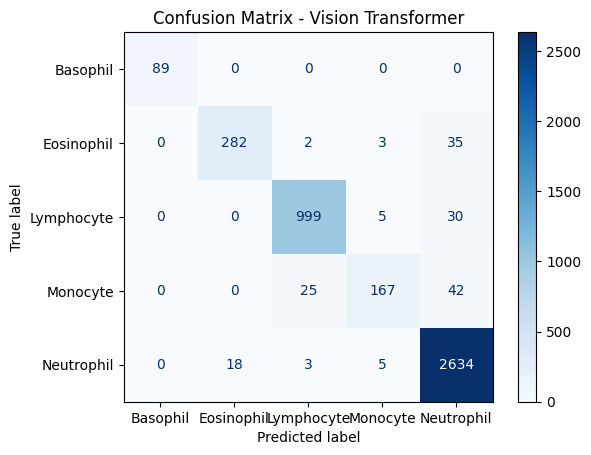

In [ ]:
import torch
import timm
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

# Load best model
model = timm.create_model(
    "vit_tiny_patch16_224",
    pretrained=False,
    num_classes=len(testA_dataset.classes)
)
model.load_state_dict(torch.load("saved_models/best_vit_model.pth", map_location=device))
model.to(device)   
model.eval()

all_preds = []
all_labels = []


with torch.no_grad():
    for images, labels in testA_loader:
        images, labels = images.to(device), labels.to(device)  
        outputs = model(images)
        _, predicted = outputs.max(1)
        all_preds.extend(predicted.cpu().numpy())  
        all_labels.extend(labels.cpu().numpy())

# Confusion matrix
cm = confusion_matrix(all_labels, all_preds)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=testA_dataset.classes)

plt.figure(figsize=(8, 6))
disp.plot(cmap="Blues", values_format="d")
plt.title("Confusion Matrix - Vision Transformer")
plt.show()


In [ ]:
from sklearn.metrics import confusion_matrix, classification_report
import torch

model.eval()
all_preds = []
all_labels = []

with torch.no_grad():
    for images, labels in testA_loader:  
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        _, predicted = torch.max(outputs, 1)
        all_preds.extend(predicted.cpu().numpy())
        all_labels.extend(labels.cpu().numpy())

# Confusion Matrix
cm = confusion_matrix(all_labels, all_preds)
print("Confusion Matrix:")
print(cm)

# Classification Report
report = classification_report(all_labels, all_preds, target_names=['Neutrophil', 'Lymphocyte', 'Monocyte', 'Eosinophil', 'Basophil'])
print("\nClassification Report:")
print(report)


Confusion Matrix:
[[  89    0    0    0    0]
 [   0  282    2    3   35]
 [   0    0  999    5   30]
 [   0    0   25  167   42]
 [   0   18    3    5 2634]]

Classification Report:
              precision    recall  f1-score   support

  Neutrophil       1.00      1.00      1.00        89
  Lymphocyte       0.94      0.88      0.91       322
    Monocyte       0.97      0.97      0.97      1034
  Eosinophil       0.93      0.71      0.81       234
    Basophil       0.96      0.99      0.98      2660

    accuracy                           0.96      4339
   macro avg       0.96      0.91      0.93      4339
weighted avg       0.96      0.96      0.96      4339



In [44]:
import torch
from torchcam.methods import SmoothGradCAMpp
from torchvision.transforms.functional import normalize, to_pil_image
import matplotlib.pyplot as plt


In [45]:
# model should be in eval mode
model.eval()

# Initialize Grad-CAM
cam_extractor = SmoothGradCAMpp(model)


In [46]:
# Use a small batch from validation
images, labels = next(iter(testA_loader))  
images, labels = images.to(device), labels.to(device)

# Forward pass
outputs = model(images)
preds = outputs.argmax(dim=1)

# Compute Grad-CAM for the predicted class
cams = [cam_extractor(pred.item(), outputs[i].unsqueeze(0)) for i, pred in enumerate(preds)]


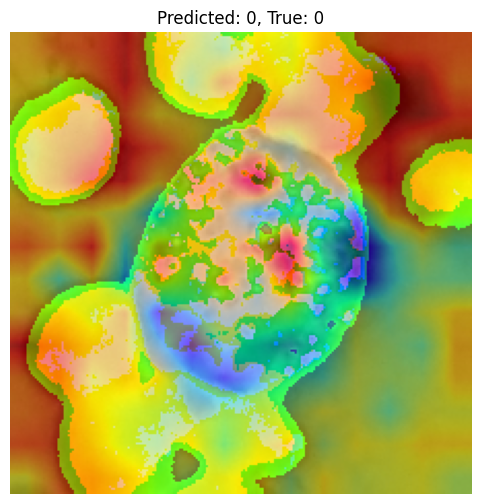

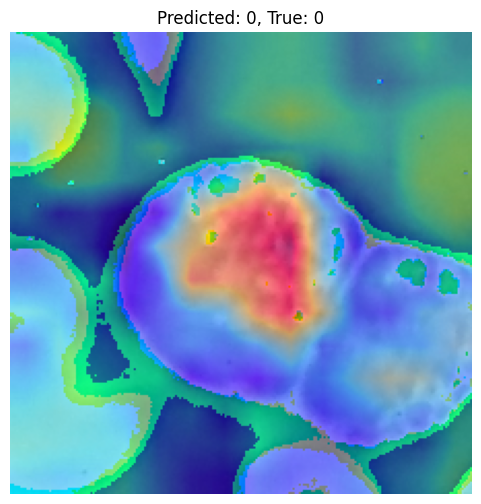

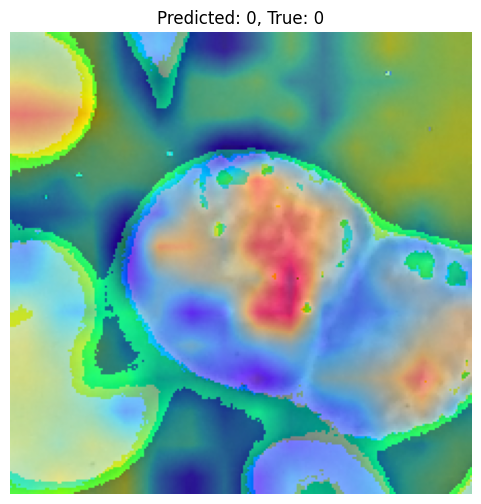

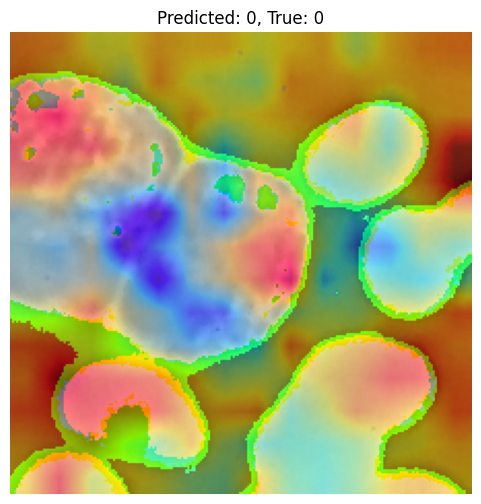

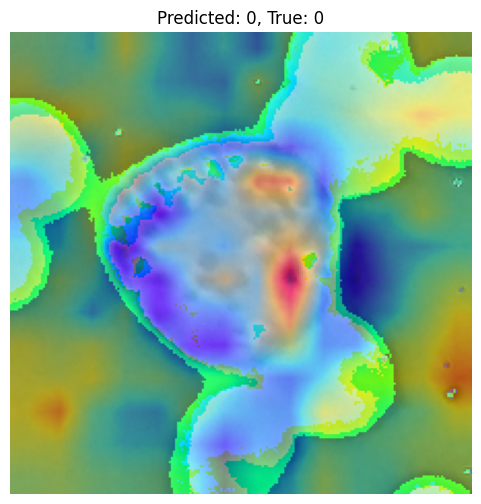

...

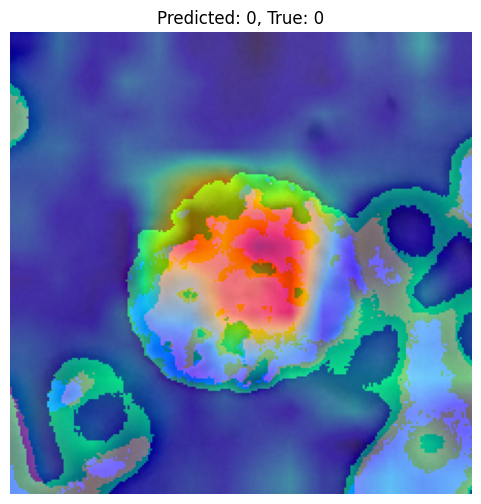

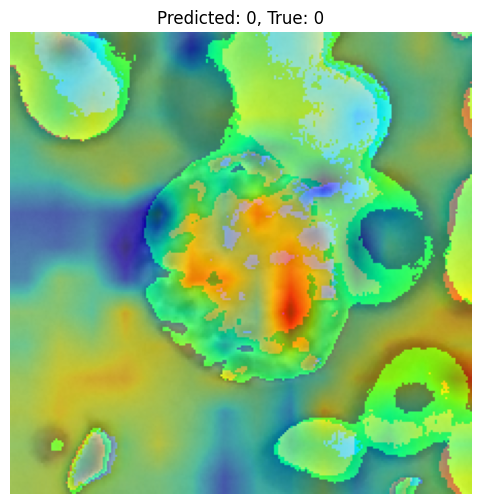

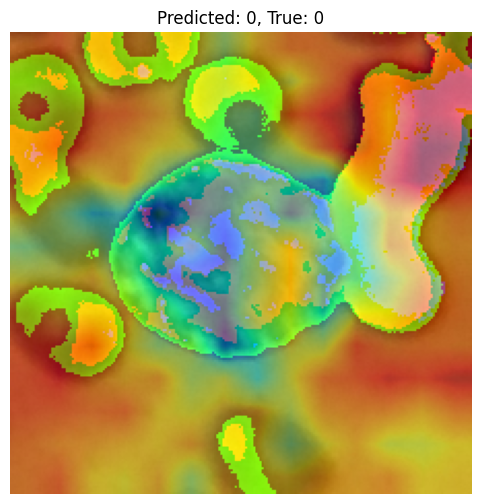

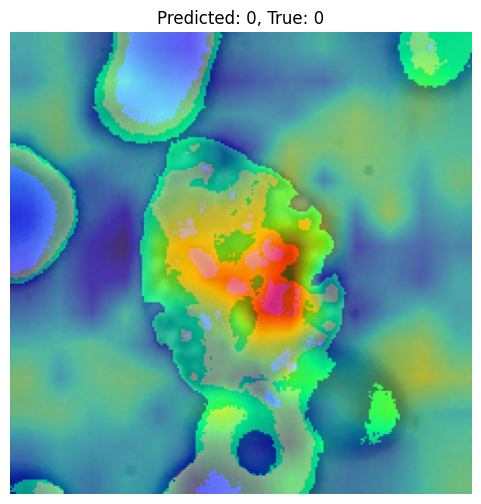

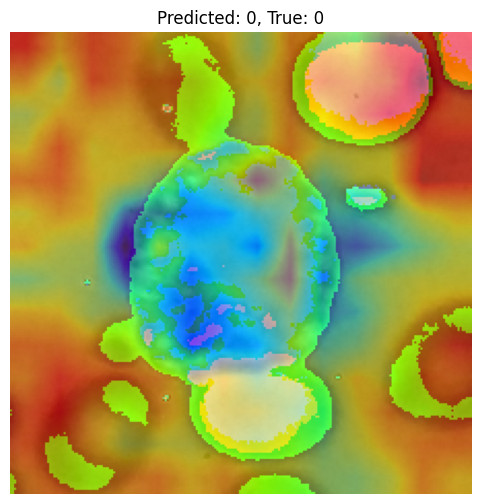

In [ ]:
import torch.nn.functional as F

patch_size = 16
num_patches_per_side = 224 // patch_size  # 14

for i in range(len(images)):
    image = images[i].cpu()

    cam_list = cams[i]  # make sure it's for one image
    cam_tensor = cam_list[-1]  # last layer attention map

    # If cam_tensor is (num_heads, num_tokens, num_tokens)
    if cam_tensor.ndim == 3:
        cam_tensor = cam_tensor.mean(dim=0)  # average heads → (num_tokens, num_tokens)

    cam_tensor = cam_tensor[1:, 0]  # drop CLS token, take CLS attention on patches → shape (196,)
    cam_tensor = cam_tensor.reshape(num_patches_per_side, num_patches_per_side)

    cam_tensor = (cam_tensor - cam_tensor.min()) / (cam_tensor.max() - cam_tensor.min() + 1e-8)
    cam_resized = F.interpolate(cam_tensor.unsqueeze(0).unsqueeze(0), size=(224,224), mode='bilinear', align_corners=False)
    cam_resized = cam_resized.squeeze().cpu().numpy()

    img_pil = to_pil_image(image)

    plt.figure(figsize=(6,6))
    plt.imshow(img_pil)
    plt.imshow(cam_resized, cmap='jet', alpha=0.5)
    plt.title(f'Predicted: {preds[i].item()}, True: {labels[i].item()}')
    plt.axis('off')
    plt.show()


In [79]:
import torch
import torch.nn as nn
from torchvision import transforms
from torchvision.transforms.functional import to_pil_image
from timm import create_model
import matplotlib.pyplot as plt
import numpy as np
from lime import lime_image
from skimage.segmentation import mark_boundaries

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

model = create_model('vit_tiny_patch16_224', pretrained=False, num_classes=5)  
model.load_state_dict(torch.load("saved_models/best_vit_model.pth", map_location=device))
model.to(device)
model.eval()


VisionTransformer(
  (patch_embed): PatchEmbed(
    (proj): Conv2d(3, 192, kernel_size=(16, 16), stride=(16, 16))
    (norm): Identity()
  )
  (pos_drop): Dropout(p=0.0, inplace=False)
  (patch_drop): Identity()
  (norm_pre): Identity()
  (blocks): Sequential(
    (0): Block(
      (norm1): LayerNorm((192,), eps=1e-06, elementwise_affine=True)
      (attn): Attention(
        (qkv): Linear(in_features=192, out_features=576, bias=True)
        (q_norm): Identity()
        (k_norm): Identity()
        (attn_drop): Dropout(p=0.0, inplace=False)
        (norm): Identity()
        (proj): Linear(in_features=192, out_features=192, bias=True)
        (proj_drop): Dropout(p=0.0, inplace=False)
      )
      (ls1): Identity()
      (drop_path1): Identity()
      (norm2): LayerNorm((192,), eps=1e-06, elementwise_affine=True)
      (mlp): Mlp(
        (fc1): Linear(in_features=192, out_features=768, bias=True)
        (act): GELU(approximate='none')
        (drop1): Dropout(p=0.0, inplace=False)


In [59]:
# 2. Preprocessing
transform = transforms.Compose([
    transforms.Resize((224,224)),
    transforms.ToTensor(),
])



In [62]:
img_path = "Raabin-WBC/Test-A/Basophil/20190526_163027_0.jpg"   # <-- put your real image path here
original_image = Image.open(img_path).convert("RGB")
image_tensor = transform(original_image).unsqueeze(0).to(device)


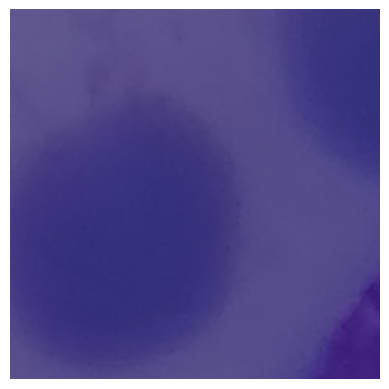

In [78]:
import torch
from torchvision import models, transforms
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np

model = models.vit_b_16(weights="IMAGENET1K_V1")
model.eval()

transform = transforms.Compose([
    transforms.Resize((224,224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485,0.456,0.406],
                         std=[0.229,0.224,0.225])
])

image_path = "Raabin-WBC/Test-A/Basophil/20190526_163027_0.jpg"
original_image = Image.open(image_path).convert("RGB")
image_tensor = transform(original_image).unsqueeze(0)

# Grad-CAM hook
features = None
gradients = None

def forward_hook(module, input, output):
    global features
    features = output

def backward_hook(module, grad_in, grad_out):
    global gradients
    gradients = grad_out[0]

# Register hooks to the last block's output
model.encoder.layers[-1].register_forward_hook(forward_hook)
model.encoder.layers[-1].register_backward_hook(backward_hook)

# Forward
output = model(image_tensor)
pred_class = output.argmax(dim=1).item()

# Backward
model.zero_grad()
score = output[0, pred_class]
score.backward()

# Compute Grad-CAM correctly
grad_mean = gradients.mean(dim=-1, keepdim=True)  
cam = (grad_mean * features).sum(dim=-1)[0, 1:]  

# reshape dynamically
num_patches = cam.shape[0]
h = w = int(num_patches ** 0.5)
cam = cam.reshape(h, w).detach().cpu().numpy()
cam = (cam - cam.min()) / (cam.max() - cam.min() + 1e-8)

# Display
plt.imshow(original_image)
plt.imshow(np.kron(cam, np.ones((16,16))), cmap='jet', alpha=0.5)
plt.axis('off')
plt.show()


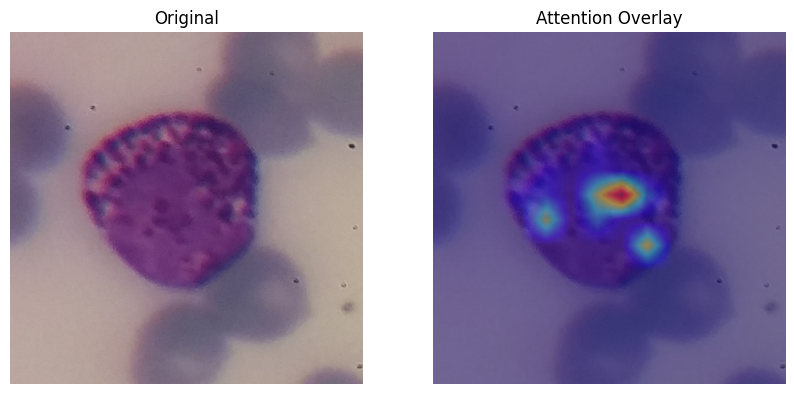

In [7]:
import torch
import torch.nn as nn
import timm
import numpy as np
import cv2
import matplotlib.pyplot as plt
from torchvision import transforms
from PIL import Image

# -------------------------
# Load trained model
# -------------------------
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = timm.create_model('vit_tiny_patch16_224', pretrained=False, num_classes=5)
model.load_state_dict(torch.load("saved_models/best_vit_model.pth", map_location=device))
model.to(device)
model.eval()

# -------------------------
# Preprocessing
# -------------------------
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=(0.5,0.5,0.5), std=(0.5,0.5,0.5))
])

def load_image(path):
    img = Image.open(path).convert("RGB")
    return transform(img).unsqueeze(0).to(device), np.array(img)

# -------------------------
# Attention Rollout
# -------------------------
import torch
import numpy as np
import cv2
import matplotlib.pyplot as plt

def get_attention_map(model, x, discard_ratio=0.9):
    attn_blocks = []

    def forward_hook(module, inp, out):
        B, N, C = inp[0].shape
        qkv = module.qkv(inp[0])  # [B, N, 3*C]
        qkv = qkv.reshape(B, N, 3, module.num_heads, C // module.num_heads).permute(2, 0, 3, 1, 4)
        q, k, v = qkv[0], qkv[1], qkv[2]
        attn = (q @ k.transpose(-2, -1)) * (1.0 / (q.shape[-1] ** 0.5))
        attn = attn.softmax(dim=-1)  # [B, heads, N, N]
        attn_blocks.append(attn.detach().cpu().numpy())

    hooks = []
    for blk in model.blocks:
        hooks.append(blk.attn.register_forward_hook(forward_hook))

    with torch.no_grad():
        _ = model(x)

    for h in hooks:
        h.remove()

    if len(attn_blocks) == 0:
        raise RuntimeError("No attention maps were captured!")

    # average across layers and heads
    attn_blocks = np.concatenate(attn_blocks, axis=0)  # [layers*B, heads, N, N]

    result = np.eye(attn_blocks.shape[-1])
    for attn in attn_blocks:
        attn_heads = attn.mean(axis=0)  # avg heads
        flat = attn_heads.reshape(-1)
        n_keep = int(flat.shape[0] * (1 - discard_ratio))
        idx = flat.argsort()[-n_keep:]
        mask = np.zeros_like(flat)
        mask[idx] = 1
        mask = mask.reshape(attn_heads.shape)
        attn_heads = attn_heads * mask
        attn_heads = attn_heads / (attn_heads.sum(axis=-1, keepdims=True) + 1e-6)
        result = result @ attn_heads

    mask = result[0, 1:]  # remove CLS token
    width = height = int(mask.shape[0] ** 0.5)
    mask = mask.reshape(width, height)
    mask = cv2.resize(mask, (224, 224))
    mask = (mask - mask.min()) / (mask.max() - mask.min())
    return mask


# Example visualize function
def visualize(image_path):
    tensor_img, orig_img = load_image(image_path)
    attn_map = get_attention_map(model, tensor_img)

    # Resize attention map to original image size
    attn_resized = cv2.resize(attn_map, (orig_img.shape[1], orig_img.shape[0]))

    # Apply colormap
    heatmap = cv2.applyColorMap(np.uint8(255 * attn_resized), cv2.COLORMAP_JET)

    # Overlay heatmap on original
    overlay = cv2.addWeighted(cv2.cvtColor(orig_img, cv2.COLOR_RGB2BGR), 0.6, heatmap, 0.4, 0)

    # Show results
    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.imshow(orig_img)
    plt.axis("off")
    plt.title("Original")

    plt.subplot(1, 2, 2)
    plt.imshow(cv2.cvtColor(overlay, cv2.COLOR_BGR2RGB))
    plt.axis("off")
    plt.title("Attention Overlay")
    plt.show()



# -------------------------
# Run on your image
# -------------------------
visualize("Raabin-WBC/Test-A/Basophil/20190526_163545_0.jpg")


In [9]:
import os, glob, random, cv2, torch, numpy as np
from PIL import Image
import matplotlib.pyplot as plt
from torchvision import transforms
import timm

# -------------------------
# Config
# -------------------------
device = torch.device("mps" if torch.backends.mps.is_available()
                      else "cuda" if torch.cuda.is_available()
                      else "cpu")

model = timm.create_model('vit_tiny_patch16_224', pretrained=False, num_classes=5)
model.load_state_dict(torch.load("saved_models/best_vit_model.pth", map_location=device))
model.to(device).eval()

# Edit these:
input_dir = "Raabin-WBC/Test-A/Basophil"     # any folder with images (can be a root with subfolders)
output_dir = "viz_outputs"          # where overlays will be saved
n_images = 200                     # how many images to generate (set >= 5)
discard_ratio = 0.85                # larger -> sparser, tighter attention (try 0.8–0.95)

os.makedirs(output_dir, exist_ok=True)

# If you want pretty class names on images (optional):
# class_names = ['Neutrophil', 'Lymphocyte', 'Monocyte', 'Eosinophil', 'Basophil']
# If you don't know the order, we’ll just show the index.

# -------------------------
# Preprocessing
# -------------------------
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=(0.5,0.5,0.5), std=(0.5,0.5,0.5))
])

def load_image_for_model(path):
    img = Image.open(path).convert("RGB")
    t = transform(img).unsqueeze(0).to(device)
    return t, np.array(img)  # PIL->np RGB

# -------------------------
# Attention Rollout (timm ViT)
# -------------------------
@torch.no_grad()
def attention_rollout_map(model, x, discard_ratio=0.85):
    """
    Captures attention from each transformer block by recomputing attn in a forward hook.
    Returns a 2D heatmap (H=W=14 for vit_tiny_patch16_224), later resized to original.
    """
    attn_blocks = []

    def hook_attention(module, inputs, output):
        # inputs[0] is the token sequence [B, N, C]
        tokens = inputs[0]              # [B, N, C]
        B, N, C = tokens.shape
        # qkv projection and reshape
        qkv = module.qkv(tokens)        # [B, N, 3*C]
        num_heads = module.num_heads
        head_dim = C // num_heads
        qkv = qkv.reshape(B, N, 3, num_heads, head_dim).permute(2, 0, 3, 1, 4)
        q, k, v = qkv[0], qkv[1], qkv[2]  # [B, heads, N, head_dim]
        # attention
        attn = (q @ k.transpose(-2, -1)) * (1.0 / (head_dim ** 0.5))  # [B, heads, N, N]
        attn = attn.softmax(dim=-1)
        attn_blocks.append(attn.detach().cpu())

    hooks = [blk.attn.register_forward_hook(hook_attention) for blk in model.blocks]
    _ = model(x)  # forward pass triggers hooks
    for h in hooks:
        h.remove()

    if len(attn_blocks) == 0:
        raise RuntimeError("No attention maps captured. Check model type / hooks.")

    # Combine layers: multiply normalized attentions (Attention Rollout)
    # attn_blocks: list of [B, heads, N, N]; take batch 0 and mean over heads
    attns = [a[0].mean(dim=0).numpy() for a in attn_blocks]  # each [N, N]
    result = np.eye(attns[0].shape[-1], dtype=np.float32)
    for attn in attns:
        # sparsify by discarding low attention per row
        A = attn.copy()
        flat = A.reshape(-1)
        # keep (1 - discard_ratio) of the strongest entries globally
        k = max(1, int(flat.size * (1 - discard_ratio)))
        thresh = np.partition(flat, -k)[-k]
        A[A < thresh] = 0.0
        # row-normalize
        A = A / (A.sum(axis=-1, keepdims=True) + 1e-6)
        result = result @ A

    # drop CLS -> first row’s attention to patch tokens (or column; both common—use row 0 to tokens 1:)
    mask = result[0, 1:]          # [num_patches]
    side = int(np.sqrt(mask.shape[0]))  # 14 for 224/16
    mask = mask.reshape(side, side)
    # normalize 0-1
    mask = (mask - mask.min()) / (mask.max() - mask.min() + 1e-8)
    return mask  # low-res heatmap

def overlay_attention(orig_img_rgb, attn_map_2d):
    # Resize attention to original image size
    H, W = orig_img_rgb.shape[:2]
    attn_resized = cv2.resize(attn_map_2d, (W, H))
    heatmap = cv2.applyColorMap(np.uint8(255 * attn_resized), cv2.COLORMAP_JET)
    overlay = cv2.addWeighted(cv2.cvtColor(orig_img_rgb, cv2.COLOR_RGB2BGR), 0.60, heatmap, 0.40, 0)
    return overlay, attn_resized

# -------------------------
# Gather images
# -------------------------
exts = ("*.jpg", "*.jpeg", "*.png", "*.bmp")
all_paths = []
for root, _, _ in os.walk(input_dir):
    for e in exts:
        all_paths.extend(glob.glob(os.path.join(root, e)))

if len(all_paths) == 0:
    raise FileNotFoundError(f"No images found in {input_dir}")

random.shuffle(all_paths)
chosen = all_paths[:max(5, n_images)]  # ensure at least 5

# -------------------------
# Generate and save overlays
# -------------------------
softmax = torch.nn.Softmax(dim=1)

for idx, img_path in enumerate(chosen, 1):
    try:
        x, orig = load_image_for_model(img_path)
        # prediction
        with torch.no_grad():
            logits = model(x)
            probs = softmax(logits).cpu().numpy()[0]
            pred_idx = int(np.argmax(probs))
            pred_conf = float(probs[pred_idx])

        # build title text
        # label = class_names[pred_idx] if 'class_names' in globals() else f"class_{pred_idx}"
        label = f"class_{pred_idx}"  # replace with your known class names if available

        # attention map + overlay
        attn_map = attention_rollout_map(model, x, discard_ratio=discard_ratio)
        overlay_bgr, attn_resized = overlay_attention(orig, attn_map)

        # annotate with prediction
        text = f"{label} ({pred_conf*100:.1f}%)"
        cv2.putText(overlay_bgr, text, (12, 28), cv2.FONT_HERSHEY_SIMPLEX, 0.8, (255,255,255), 2, cv2.LINE_AA)

        # save
        out_name = os.path.splitext(os.path.basename(img_path))[0]
        save_path = os.path.join(output_dir, f"{idx:03d}_{label}_{int(pred_conf*100)}_{out_name}.png")
        cv2.imwrite(save_path, overlay_bgr)

        if idx <= 3:
            print(f"[{idx}] {img_path}  →  {save_path}")
    except Exception as e:
        print(f"Failed on {img_path}: {e}")

print(f"\nDone! Saved {len(chosen)} attention overlays to: {os.path.abspath(output_dir)}")


[1] Raabin-WBC/Test-A/Basophil/20190531_113952_0.jpg  →  viz_outputs/001_class_0_99_20190531_113952_0.png
[2] Raabin-WBC/Test-A/Basophil/20190526_163055_2.jpg  →  viz_outputs/002_class_0_99_20190526_163055_2.png
[3] Raabin-WBC/Test-A/Basophil/20190526_164040_0.jpg  →  viz_outputs/003_class_0_99_20190526_164040_0.png

Done! Saved 89 attention overlays to: /Users/varunsingh/Desktop/Raabin-WBC-Project/viz_outputs


In [10]:
import os, glob, random, cv2, torch, numpy as np
from PIL import Image
import matplotlib.pyplot as plt
from torchvision import transforms
import timm

# -------------------------
# Config
# -------------------------
device = torch.device("mps" if torch.backends.mps.is_available()
                      else "cuda" if torch.cuda.is_available()
                      else "cpu")

model = timm.create_model('vit_tiny_patch16_224', pretrained=False, num_classes=5)
model.load_state_dict(torch.load("saved_models/best_vit_model.pth", map_location=device))
model.to(device).eval()

# Edit these:
input_dir = "Raabin-WBC/Test-A/Eosinophil"     # any folder with images (can be a root with subfolders)
output_dir = "viz_outputs"          # where overlays will be saved
n_images = 10                       # how many images to generate (set >= 5)
discard_ratio = 0.85                # larger -> sparser, tighter attention (try 0.8–0.95)

os.makedirs(output_dir, exist_ok=True)

# If you want pretty class names on images (optional):
# class_names = ['Neutrophil', 'Lymphocyte', 'Monocyte', 'Eosinophil', 'Basophil']
# If you don't know the order, we’ll just show the index.

# -------------------------
# Preprocessing
# -------------------------
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=(0.5,0.5,0.5), std=(0.5,0.5,0.5))
])

def load_image_for_model(path):
    img = Image.open(path).convert("RGB")
    t = transform(img).unsqueeze(0).to(device)
    return t, np.array(img)  # PIL->np RGB

# -------------------------
# Attention Rollout (timm ViT)
# -------------------------
@torch.no_grad()
def attention_rollout_map(model, x, discard_ratio=0.85):
    """
    Captures attention from each transformer block by recomputing attn in a forward hook.
    Returns a 2D heatmap (H=W=14 for vit_tiny_patch16_224), later resized to original.
    """
    attn_blocks = []

    def hook_attention(module, inputs, output):
        # inputs[0] is the token sequence [B, N, C]
        tokens = inputs[0]              # [B, N, C]
        B, N, C = tokens.shape
        # qkv projection and reshape
        qkv = module.qkv(tokens)        # [B, N, 3*C]
        num_heads = module.num_heads
        head_dim = C // num_heads
        qkv = qkv.reshape(B, N, 3, num_heads, head_dim).permute(2, 0, 3, 1, 4)
        q, k, v = qkv[0], qkv[1], qkv[2]  # [B, heads, N, head_dim]
        # attention
        attn = (q @ k.transpose(-2, -1)) * (1.0 / (head_dim ** 0.5))  # [B, heads, N, N]
        attn = attn.softmax(dim=-1)
        attn_blocks.append(attn.detach().cpu())

    hooks = [blk.attn.register_forward_hook(hook_attention) for blk in model.blocks]
    _ = model(x)  # forward pass triggers hooks
    for h in hooks:
        h.remove()

    if len(attn_blocks) == 0:
        raise RuntimeError("No attention maps captured. Check model type / hooks.")

    # Combine layers: multiply normalized attentions (Attention Rollout)
    # attn_blocks: list of [B, heads, N, N]; take batch 0 and mean over heads
    attns = [a[0].mean(dim=0).numpy() for a in attn_blocks]  # each [N, N]
    result = np.eye(attns[0].shape[-1], dtype=np.float32)
    for attn in attns:
        # sparsify by discarding low attention per row
        A = attn.copy()
        flat = A.reshape(-1)
        # keep (1 - discard_ratio) of the strongest entries globally
        k = max(1, int(flat.size * (1 - discard_ratio)))
        thresh = np.partition(flat, -k)[-k]
        A[A < thresh] = 0.0
        # row-normalize
        A = A / (A.sum(axis=-1, keepdims=True) + 1e-6)
        result = result @ A

    # drop CLS -> first row’s attention to patch tokens (or column; both common—use row 0 to tokens 1:)
    mask = result[0, 1:]          # [num_patches]
    side = int(np.sqrt(mask.shape[0]))  # 14 for 224/16
    mask = mask.reshape(side, side)
    # normalize 0-1
    mask = (mask - mask.min()) / (mask.max() - mask.min() + 1e-8)
    return mask  # low-res heatmap

def overlay_attention(orig_img_rgb, attn_map_2d):
    # Resize attention to original image size
    H, W = orig_img_rgb.shape[:2]
    attn_resized = cv2.resize(attn_map_2d, (W, H))
    heatmap = cv2.applyColorMap(np.uint8(255 * attn_resized), cv2.COLORMAP_JET)
    overlay = cv2.addWeighted(cv2.cvtColor(orig_img_rgb, cv2.COLOR_RGB2BGR), 0.60, heatmap, 0.40, 0)
    return overlay, attn_resized

# -------------------------
# Gather images
# -------------------------
exts = ("*.jpg", "*.jpeg", "*.png", "*.bmp")
all_paths = []
for root, _, _ in os.walk(input_dir):
    for e in exts:
        all_paths.extend(glob.glob(os.path.join(root, e)))

if len(all_paths) == 0:
    raise FileNotFoundError(f"No images found in {input_dir}")

random.shuffle(all_paths)
chosen = all_paths[:max(5, n_images)]  # ensure at least 5

# -------------------------
# Generate and save overlays
# -------------------------
softmax = torch.nn.Softmax(dim=1)

for idx, img_path in enumerate(chosen, 1):
    try:
        x, orig = load_image_for_model(img_path)
        # prediction
        with torch.no_grad():
            logits = model(x)
            probs = softmax(logits).cpu().numpy()[0]
            pred_idx = int(np.argmax(probs))
            pred_conf = float(probs[pred_idx])

        # build title text
        # label = class_names[pred_idx] if 'class_names' in globals() else f"class_{pred_idx}"
        label = f"class_{pred_idx}"  # replace with your known class names if available

        # attention map + overlay
        attn_map = attention_rollout_map(model, x, discard_ratio=discard_ratio)
        overlay_bgr, attn_resized = overlay_attention(orig, attn_map)

        # annotate with prediction
        text = f"{label} ({pred_conf*100:.1f}%)"
        cv2.putText(overlay_bgr, text, (12, 28), cv2.FONT_HERSHEY_SIMPLEX, 0.8, (255,255,255), 2, cv2.LINE_AA)

        # save
        out_name = os.path.splitext(os.path.basename(img_path))[0]
        save_path = os.path.join(output_dir, f"{idx:03d}_{label}_{int(pred_conf*100)}_{out_name}.png")
        cv2.imwrite(save_path, overlay_bgr)

        if idx <= 3:
            print(f"[{idx}] {img_path}  →  {save_path}")
    except Exception as e:
        print(f"Failed on {img_path}: {e}")

print(f"\nDone! Saved {len(chosen)} attention overlays to: {os.path.abspath(output_dir)}")


[1] Raabin-WBC/Test-A/Eosinophil/95-8-27-1_107_3.jpg  →  viz_outputs/001_class_1_99_95-8-27-1_107_3.png
[2] Raabin-WBC/Test-A/Eosinophil/95-8-27-1_459_5.jpg  →  viz_outputs/002_class_1_73_95-8-27-1_459_5.png
[3] Raabin-WBC/Test-A/Eosinophil/95-8-27-1_11_2.jpg  →  viz_outputs/003_class_4_52_95-8-27-1_11_2.png

Done! Saved 10 attention overlays to: /Users/varunsingh/Desktop/Raabin-WBC-Project/viz_outputs
